<center> <img src = https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/hh%20label.jpg alt="drawing" style="width:400px;">

# <center> Project: Analysis of CVs from HeadHunter

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


# Examining the data structure

1. Read the data using the Pandas library.

In [30]:
original_data = pd.read_csv('C:/Users/atade/Downloads/dst-3.0_16_1_hh_database1.csv', sep=';') 
data = original_data.copy()

2. Print the first few rows of the table to make sure the data is not corrupted.

In [31]:
display(data.head())


,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
0,"Мужчина , 39 лет , родился 27 ноября 1979",29000 руб.,Системный администратор,"Советск (Калининградская область) , не готов к...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...",Опыт работы 16 лет 10 месяцев Август 2010 — п...,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,Неоконченное высшее образование 2000 Балтийск...,16.04.2019 15:59,Имеется собственный автомобиль
1,"Мужчина , 60 лет , родился 20 марта 1959",40000 руб.,Технический писатель,"Королев , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Опыт работы 19 лет 5 месяцев Январь 2000 — по...,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",Высшее образование 1981 Военно-космическая ак...,12.04.2019 08:42,Не указано
2,"Женщина , 36 лет , родилась 12 августа 1982",20000 руб.,Оператор,"Тверь , не готова к переезду , не готова к ком...",полная занятость,полный день,Опыт работы 10 лет 3 месяца Октябрь 2004 — Де...,ПАО Сбербанк,Кассир-операционист,Среднее специальное образование 2002 Профессио...,16.04.2019 08:35,Не указано
3,"Мужчина , 38 лет , родился 25 июня 1980",100000 руб.,Веб-разработчик (HTML / CSS / JS / PHP / базы ...,"Саратов , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, удаленная работа",Опыт работы 18 лет 9 месяцев Август 2017 — Ап...,OpenSoft,Инженер-программист,Высшее образование 2002 Саратовский государст...,08.04.2019 14:23,Не указано
4,"Женщина , 26 лет , родилась 3 марта 1993",140000 руб.,Региональный менеджер по продажам,"Москва , не готова к переезду , готова к коман...",полная занятость,полный день,Опыт работы 5 лет 7 месяцев Региональный мене...,Мармелад,Менеджер по продажам,Высшее образование 2015 Кгу Психологии и педаг...,22.04.2019 10:32,Не указано


3. Display basic information about the number of non-empty values in the columns and their types in the table.

4. Let's pay attention to the information about the number of non-empty values.

In [32]:
display(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 12 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   Пол, возраст                     44744 non-null  object
 1   ЗП                               44744 non-null  object
 2   Ищет работу на должность:        44744 non-null  object
 3   Город, переезд, командировки     44744 non-null  object
 4   Занятость                        44744 non-null  object
 5   График                           44744 non-null  object
 6   Опыт работы                      44576 non-null  object
 7   Последнее/нынешнее место работы  44743 non-null  object
 8   Последняя/нынешняя должность     44742 non-null  object
 9   Образование и ВУЗ                44744 non-null  object
 10  Обновление резюме                44744 non-null  object
 11  Авто                             44744 non-null  object
dtypes: object(12)
memory usage: 4.1+

None

5. Display basic statistical information about the columns.

In [33]:
display(data.describe())

display()

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
count,44744,44744,44744,44744,44744,44744,44576,44743,44742,44744,44744,44744
unique,16003,690,14929,10063,38,47,44413,30214,16927,40148,18838,2
top,"Мужчина , 32 года , родился 17 сентября 1986",50000 руб.,Системный администратор,"Москва , не готов к переезду , не готов к кома...",полная занятость,полный день,Опыт работы 10 лет 8 месяцев Апрель 2018 — по...,Индивидуальное предпринимательство / частная п...,Системный администратор,Высшее образование 1987 Военный инженерный Кра...,07.05.2019 09:50,Не указано
freq,18,4064,3099,1261,30026,22727,3,935,2062,4,25,32268


# Data transformation

1. Let's start with a simple one - with the attribute ** "Education and University" **. Its current format is: **<Education level Year of graduation University degree...>**. For example:
* Higher education 2016 Moscow Aviation Institute (National Research University)...
* Incomplete higher education 2000 Baltic State Fishing Fleet Academy…
We are only interested in the level of education.

Using the transformation function, we will create a new attribute **"Education"**, which should have 4 categories: "higher", "incomplete higher", "secondary special" and "secondary".

Perform the transformation, answer the security questions and remove the "Education and university" feature.

In [34]:
def education(lvl):

    lvl = ((str(lvl).split(sep=' '))[0:2])
    if lvl[1] == 'образование':
        return str(lvl[0])
    return ' '.join(lvl)

data['Образование'] = data['Образование и ВУЗ'].apply(education)
data.drop(columns=['Образование и ВУЗ'], inplace=True)
display(data['Образование'].head(15))
display(data[data['Образование']=='Среднее'])
        

0     Неоконченное высшее
1                  Высшее
2     Среднее специальное
3                  Высшее
4                  Высшее
5     Неоконченное высшее
6                  Высшее
7                  Высшее
8     Неоконченное высшее
9                  Высшее
10    Среднее специальное
11                 Высшее
12    Среднее специальное
13                 Высшее
14    Среднее специальное
Name: Образование, dtype: object

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование
178,"Мужчина , 26 лет , родился 11 июня 1992",20000 руб.,Системный администратор,"Омск , не готов к переезду , не готов к команд...",полная занятость,полный день,Опыт работы 1 год Июнь 2018 — по настоящее вр...,Жкх,Системный администратор,18.04.2019 20:45,Имеется собственный автомобиль,Среднее
217,"Мужчина , 28 лет , родился 2 января 1991",35000 руб.,"Монтажник линии связи, техник","Новосибирск , не готов к переезду , готов к ко...","стажировка, частичная занятость, полная занятость","гибкий график, полный день, сменный график, уд...",Опыт работы 2 года 7 месяцев Ноябрь 2016 — по...,Обь телеком,Монтажник линии связи,17.04.2019 11:03,Не указано,Среднее
286,"Мужчина , 35 лет , родился 9 сентября 1983",40000 руб.,Системный администратор,"Жигулевск , не готов к переезду , готов к редк...","частичная занятость, полная занятость","гибкий график, полный день, сменный график, уд...",Опыт работы 5 лет 2 месяца Август 2017 — по н...,ОСК Инфотранс,Старший специалист,11.04.2019 11:33,Имеется собственный автомобиль,Среднее
315,"Мужчина , 32 года , родился 1 сентября 1986",40000 руб.,"Монтажник систем связи, промальпинист","Салехард , не готов к переезду , готов к коман...",полная занятость,полный день,Опыт работы 5 лет 2 месяца Май 2014 — Декабрь...,"ООО""Екатеринбург-2000""","антенщик-мачтовик,совмещение сварщик",12.04.2019 09:16,Не указано,Среднее
339,"Мужчина , 27 лет , родился 13 сентября 1991",250000 руб.,Руководитель отдела разработки ПО,"Москва , м. Люблино , не готов к переезду , г...","частичная занятость, полная занятость","полный день, удаленная работа",Опыт работы 8 лет 1 месяц Руководитель отдела...,"ООО ""Международные процессинговые системы""",Руководитель отдела разработки,02.11.2018 08:18,Не указано,Среднее
...,...,...,...,...,...,...,...,...,...,...,...,...
44378,"Женщина , 26 лет , родилась 1 февраля 1993",20000 руб.,Контент-менеджер,"Смоленск , не готова к переезду , не готова к ...","частичная занятость, полная занятость","гибкий график, полный день, сменный график, уд...",Опыт работы 6 лет 4 месяца Контент-менеджер 2...,ООО ЛотИнфо,Контент-менеджер,26.04.2019 13:52,Не указано,Среднее
44394,"Мужчина , 33 года , родился 14 апреля 1986",50000 руб.,Специалист технической поддержки,"Москва , м. Коньково , не готов к переезду , ...",полная занятость,полный день,Опыт работы 14 лет Март 2015 — по настоящее в...,"ООО ""АСПИД Компани""",Мастер установщик дополнительного оборудования,10.04.2019 01:49,Имеется собственный автомобиль,Среднее
44514,"Мужчина , 29 лет , родился 20 марта 1990",30000 руб.,Мастер по ремонту компьютеров,"Томск , не готов к переезду , готов к командир...",полная занятость,полный день,Опыт работы 1 год 8 месяцев Июль 2014 — Февра...,ИП Воронин А.Н.,Менеджер по работе с клиентами,07.05.2019 04:28,Имеется собственный автомобиль,Среднее
44574,"Мужчина , 21 год , родился 5 марта 1998",50000 руб.,Software Engineer,"Ижевск , готов к переезду , не готов к команди...",полная занятость,"гибкий график, полный день",Опыт работы 3 года 1 месяц Ноябрь 2018 — по н...,Picom,Software Engineer,08.04.2019 20:38,Не указано,Среднее


2. Now we are interested in the column **"Sex, age"**. Now it is presented in the format **<Gender, age, date of birth>**. For example:
* Male, 39 years old, born November 27, 1979
* Female, aged 21, born January 13, 2000
As you understand, we need to highlight each parameter in a separate column.

Let's create two new features **"Gender"** and **"Age"**. It is important to take into account:
* The gender attribute must have 2 unique string values: 'M' - male, 'F' - female.
* Sign of age must be represented by whole numbers.

Let's perform the transformation, answer the security questions and remove the sign **"Sex, age"** from the table.

In [35]:
data['Пол'] = data['Пол, возраст'].apply(lambda x: list(str(x))[0])
display(data['Пол'].head())
data['Возраст'] = data['Пол, возраст'].apply(lambda x: int((str(x).split(sep =' , '))[1][1:3]) )
display(data['Возраст'].head())
data.drop(columns='Пол, возраст',inplace=True)
display(data['Пол'].value_counts(normalize=True))
display(data['Возраст'].mean())

0    М
1    М
2    Ж
3    М
4    Ж
Name: Пол, dtype: object

0    39
1    60
2    36
3    38
4    26
Name: Возраст, dtype: int64

Пол
М    0.809293
Ж    0.190707
Name: proportion, dtype: float64

32.19473001966744

3. The next step is to transform the attribute **"Work experience"**. Its current format is: **<Experience: n years m months, periods of work in various companies…>**.

From the column, we need to highlight the overall work experience of the applicant in months, we will call the new attribute "Work experience (month)"


* First, there are gaps in this feature. Let's agree that if we meet a gap, we leave it as it is (the conversion function returns NaN)
* Secondly, there are hidden gaps in this feature. For some applicants, the column is set to "Not Specified". We will also denote them as NaN (the conversion function returns NaN)
* Thirdly, we are not interested in information that is described after the indication of work experience (periods of work in various companies)
* Fourth, we have a problem: work experience can only be presented in years or only months. For example, you can find the following options:
     * Experience 3 years 2 months…
     * 4 years experience...
     * 11 months work experience...
     * Consider this feature in your code

Consider this feature in our code

As a result of the conversion, we should get a column containing information about how many months the applicant has worked.
Let's do the conversion, answer the security questions, and remove the **"Experience"** column from the table.

In [36]:
data['Опыт работы'] = data['Опыт работы'].fillna(value='Не указано').apply(lambda x: str(x).split(sep='  ')[0])


def experience(arg):

    
    if arg is np.nan or arg == 'Не указано':
        return None
    year_words=['год', 'года', 'лет']
    month_words=['месяц', 'месяца', 'месяцев']
    arg_splitted = arg.split(' ')[:7]
    years = 0
    months = 0
    for index, item in enumerate (arg_splitted):
        if item in year_words:
            years = int(arg_splitted[index-1])
        if item in month_words:
            months = int(arg_splitted[index-1])
    return int(years*12 + months)

    
data['Опыт работы (месяц)'] = data['Опыт работы'].apply(experience)
display(data['Опыт работы (месяц)'])
data.drop(columns='Опыт работы', inplace=True)
display(data['Опыт работы (месяц)'].median())





0        202.0
1        233.0
2        123.0
3        225.0
4         67.0
         ...  
44739     91.0
44740     84.0
44741    257.0
44742     46.0
44743    190.0
Name: Опыт работы (месяц), Length: 44744, dtype: float64

100.0

4. The next in line sign is "City, moving, business trips". The information in it is presented in the following form: **<City, (metro), readiness to move (cities to move), readiness for business trips>**. Optional string parameters are enclosed in parentheses. For example, you can find the following options:

* Moscow, not ready to move, ready for business trips
* Moscow, Belomorskaya metro station, not ready to move, not ready for business trips
* Voronezh, ready to move (Sochi, Moscow, St. Petersburg), ready for business trips

Let's create separate features **"City"**, **"Ready to move"**, **"Ready to travel"**. It is important to take into account:

* Feature **"City"** should contain only 4 categories: "Moscow", "St. Petersburg" and "millionaire city" (their list is below), the rest will be designated as "other".

     List of million-plus cities:
    
    <code>million_cities = ['Novosibirsk', 'Yekaterinburg','Nizhny Novgorod','Kazan', 'Chelyabinsk','Omsk', 'Samara', 'Rostov-on-Don', 'Ufa', 'Krasnoyarsk' , 'Perm', 'Voronezh', 'Volgograd']
     </code>
     Information about the subway, next to which the applicant lives, does not interest us.
* The attribute **"Ready to move"** must have two possible options: True or False. Note that there are several options for describing the readiness to move in the characteristic "City, moving, business trips". For example:
     * … , ready to move , …
     * … , not ready to move , …
     * … , ready to move in (Moscow, St. Petersburg, Rostov-on-Don)
     * … , want to move (USA) , …
    
     We are only interested in the very fact of the possibility or desire to move.
* The attribute **"Ready for business trips"** must have two possible options: True or False. Please note that there are several options for describing the readiness for business trips in the characteristic "City, moving, business trips". For example:
     * … , ready for business trips , …
     * …, ready for occasional business trips, …
     * …, not ready for business trips, …
    
     We are only interested in the very fact of readiness for a business trip.
    
     Another important fact: when uploading data, some applicants "lost" information about their readiness for business trips. By default, we will assume that such applicants are not ready for business trips.

In [37]:


million_cities = [  'Новосибирск', 'Екатеринбург','Нижний Новгород','Казань',
                    'Челябинск','Омск', 'Самара', 'Ростов-на-Дону', 'Уфа',
                    'Красноярск', 'Пермь', 'Воронеж','Волгоград' ]



def city(val):

    val = str(val).split(sep=' , ')
    val = val[0]
    if val in million_cities:
        return 'город-миллионник'
    elif val == 'Москва' or val == 'Санкт-Петербург':
        return val
    else:
        return 'другие'

def moving(val):
    

    if 'не готов к переезду' in val or 'не готова к переезду'in val :
        return False
    if 'перее' not in val:
        return False
    return True

def trip(val):
    
    if 'не готов к командировк' in val or 'не готова к командировк' in val:
        return False
    if 'командировк' not in val:
        return False
    return True

data['Город'] = data['Город, переезд, командировки'].apply(city)
data['переезд'] = data['Город, переезд, командировки'].apply(moving)
data['командировки'] = data['Город, переезд, командировки'].apply(trip)

display(data['Город'].value_counts(normalize=True))
display(data[(data['переезд'] == True) & (data['командировки'] == True)].count()/data.shape[0])

data.drop(columns='Город, переезд, командировки', inplace=True)



display(data.head())


Город
Москва              0.371469
другие              0.354327
город-миллионник    0.163866
Санкт-Петербург     0.110339
Name: proportion, dtype: float64

ЗП                                 0.318657
Ищет работу на должность:          0.318657
Город, переезд, командировки       0.318657
Занятость                          0.318657
График                             0.318657
Последнее/нынешнее место работы    0.318657
Последняя/нынешняя должность       0.318657
Обновление резюме                  0.318657
Авто                               0.318657
Образование                        0.318657
Пол                                0.318657
Возраст                            0.318657
Опыт работы (месяц)                0.318188
Город                              0.318657
переезд                            0.318657
командировки                       0.318657
dtype: float64

,ЗП,Ищет работу на должность:,Занятость,График,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование,Пол,Возраст,Опыт работы (месяц),Город,переезд,командировки
0,29000 руб.,Системный администратор,"частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...","МАОУ ""СОШ № 1 г.Немана""",Системный администратор,16.04.2019 15:59,Имеется собственный автомобиль,Неоконченное высшее,М,39,202.0,другие,False,False
1,40000 руб.,Технический писатель,"частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",12.04.2019 08:42,Не указано,Высшее,М,60,233.0,другие,False,True
2,20000 руб.,Оператор,полная занятость,полный день,ПАО Сбербанк,Кассир-операционист,16.04.2019 08:35,Не указано,Среднее специальное,Ж,36,123.0,другие,False,False
3,100000 руб.,Веб-разработчик (HTML / CSS / JS / PHP / базы ...,"частичная занятость, проектная работа, полная ...","гибкий график, удаленная работа",OpenSoft,Инженер-программист,08.04.2019 14:23,Не указано,Высшее,М,38,225.0,другие,False,True
4,140000 руб.,Региональный менеджер по продажам,полная занятость,полный день,Мармелад,Менеджер по продажам,22.04.2019 10:32,Не указано,Высшее,Ж,26,67.0,Москва,False,True


5. Let's take a closer look at the features **"Employment"** and **"Schedule"**. Now the attributes are a set of categories of desired employment (full-time, part-time, project work, volunteering, internship) and desired work schedule (full-time, shift schedule, flexible schedule, remote work, shift work).
On the hh.ru website, the applicant can indicate various combinations of these categories, for example:
* full time, part time
* part-time, project work, volunteering
* full time, remote work
* shift method, flexible schedule, remote work, full time

This feature variant has many different combinations, which means many unique values, which hinders analysis. We need to fix this.

Let's create flashing signs for each category: if the category is on the applicant's wish list, then True is set in the column in place of the applicant's row, otherwise it is False.

In [38]:

data1 = data.copy()



list_for_type_work =['полная занятость', 'частичная занятость', 'проектная работа', 'волонтерство', 'стажировка']
list_for_shift = ['полный день', 'сменный график', 'гибкий график', 'удаленная работа', 'вахтовый метод']

for employment in list_for_type_work:
    
    data[employment]= data['Занятость'].apply(lambda x: employment in x)

for employment in list_for_shift:
    data[employment] = data['График'].apply(lambda x: employment in x)

data = data.drop(columns=['Занятость', 'График'])


# BAD SOLUTION
'''
list_for_type_work =['полная занятость', 'частичная занятость', 'проектная работа', 'волонтерство', 'стажировка']
for i in list_for_type_work:
    data[i] = False

for i in range(len(data['Занятость'])):
    for g in str(data.loc[i,'Занятость']).split(sep=', '):
        data[g].loc[i] = True


list_for_shift = ['полный день', 'сменный график', 'гибкий график', 'удаленная работа', 'вахтовый метод']

for i in list_for_shift:
    data[i] = False

for i in range(len(data['График'])):
    for g in str(data.loc[i,'График']).split(sep=', '):
        data[g].loc[i] = True
display(data.head())
'''
'''display(data[(data['волонтерство'] == True) & (data['проектная работа'] == True)].count())
display(data[ (data['вахтовый метод'] == True) & (data['гибкий график'] == True)].count())
'''

display(data['ЗП'].mode())



0    50000 руб.
Name: ЗП, dtype: object

6. We got to the most important and most important thing - the sign of wages **"Salary"**.

  In addition to the desired salary, the applicant indicates the currency in which he would like to receive it, for example:
* 30000 rub.
* 50000 UAH
* 550 USD

We would like to see wages in a single currency, for example, in rubles.

Let's turn to special Internet resources to obtain exchange rate data in the form of text files. We have already uploaded the exchange rates that are found in our data for the period from 12/29/2017 to 12/05/2019.

Let's create a new DataFrame from the resulting file. In the resulting table, we will be interested in the columns:
* "currency" - currency name in ISO encoding,
* "date" - date,
* "proportion" - proportion,
* "close" - closing price (the last fixed exchange rate on the specified day).


Below is a table of correspondence between the names of foreign currencies in our data and their generally accepted abbreviations, which are presented in our file with exchange rates.

<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/table.jpg>


We will take the date on which the rate is determined. It is in the attribute **"Resume Update"**, it contains the date and time when the applicant posted the current version of his resume. We are only interested in the date, according to which we will compare exchange rates.

Now we have all the necessary information in order to create the feature "Salary (rubles)" - wages in rubles.

Итак, давайте обсудим возможный алгоритм преобразования: 
1. Перевести признак "Обновление резюме" из таблицы с резюме в формат datetime и достать из него дату. В тот же формат привести признак "date" из таблицы с валютами.
2. Выделить из столбца "ЗП" сумму желаемой заработной платы и наименование валюты, в которой она исчисляется. Наименование валюты перевести в стандарт ISO согласно с таблицей выше.
3. Присоединить к таблице с резюме таблицу с курсами по столбцам с датой и названием валюты (подумайте, какой тип объединения надо выбрать, чтобы в таблице с резюме сохранились данные о заработной плате, изначально представленной в рублях). Значение close для рубля заполнить единицей 1 (курс рубля самого к себе)
4. Умножить сумму желаемой заработной платы на присоединенный курс валюты (close) и разделить на пропорцию (обратите внимание на пропуски после объединения в этих столбцах), результат занести в новый столбец "ЗП (руб)".


In [39]:
data1 = data.copy()
data_time_orig = pd.read_csv("C:/Users/atade/Downloads/ExchangeRates.csv")
data1['Обновление резюме'] = pd.to_datetime(data1['Обновление резюме'], dayfirst=True).dt.date


data_time_orig['date'] = pd.to_datetime(data_time_orig['date'], format='%d/%m/%y').dt.date
data_time = data_time_orig.drop(columns=['time', 'vol', 'per'])

def iso(val):

    list1 = {'грн.':'UAH', 'бел.руб.':'BYN', 'сум':'UZS'}
    val = str(val).split()
    if val[1] in list1.keys():
        val[1] = list1.get(val[1])
    return val[1]

def ZP(val):

    val = str(val).split(sep=' ')
    return int(val[0])
    
data1['ISO'] = data1['ЗП'].apply(iso)
data1['ЗП'] = data1['ЗП'].apply(ZP)
data1['ЗП'] = data1['ЗП'].astype(int)

data1 = pd.merge(right_on=['date', 'currency'], left_on=['Обновление резюме','ISO'], left=data1, right=data_time, how='left')


data1['ЗП(руб)'] = (data1['ЗП']*data1['close'])/data1['proportion']
data1['ЗП(руб)'] = data1['ЗП(руб)'].fillna(value='d')
data1.loc[data1['ЗП(руб)'] == 'd', 'ЗП(руб)'] = data1[data1['ISO'] == 'руб.']['ЗП']
display(data1['ЗП(руб)'])
display(data1['ЗП(руб)'].median()) # 59

data1 = data1.drop(columns=(data_time.columns) )
data1 = data1.drop(columns=['ЗП','ISO'])
data = data1.copy()
display(data1.info())

0         29000
1         40000
2         20000
3        100000
4        140000
          ...  
44739     50000
44740     39000
44741     40000
44742     20000
44743    120000
Name: ЗП(руб), Length: 44744, dtype: object

59019.0

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 23 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Ищет работу на должность:        44744 non-null  object 
 1   Последнее/нынешнее место работы  44743 non-null  object 
 2   Последняя/нынешняя должность     44742 non-null  object 
 3   Обновление резюме                44744 non-null  object 
 4   Авто                             44744 non-null  object 
 5   Образование                      44744 non-null  object 
 6   Пол                              44744 non-null  object 
 7   Возраст                          44744 non-null  int64  
 8   Опыт работы (месяц)              44574 non-null  float64
 9   Город                            44744 non-null  object 
 10  переезд                          44744 non-null  bool   
 11  командировки                     44744 non-null  bool   
 12  полная занятость  

None

# Explore data dependencies

1. Let's build the distribution of the feature **"Age"**. Describe the distribution, answering the following questions: what is the mode of distribution, what are the limiting values of the attribute, in what approximate interval is the age of most applicants? Are there any anomalies for the sign of age?

0    30
Name: Возраст, dtype: int64

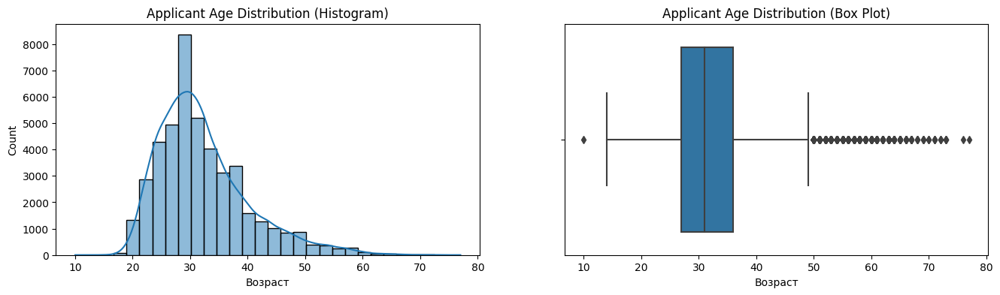

In [40]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize = (16,4))

sns.histplot(
    data = data,
    x = 'Возраст',
    kde = True,
    bins = 30,
    ax=axes[0],
    
).set_title('Applicant Age Distribution (Histogram)')


sns.boxplot(
    data = data,
    x = 'Возраст',
    ax=axes[1]
).set_title('Applicant Age Distribution (Box Plot)')
display(data['Возраст'].mode())

The largest number of applicants are in the age range from 20 to 40. However, at the same time, the box plot indicates some outliers in the form of age after about 50 years. The histogram graph appears normal with slight right-sided asymmetry; There are no outliers on the histogram.

2. Let's build the distribution of the attribute **"Work experience (month)"**. Let us describe this distribution by answering the following questions: what is the mode of distribution, what are the limiting values of the attribute, in what approximate interval is the work experience of most applicants? Are there any anomalies for the work experience feature?

In [41]:

def sigma_3(df, col, emiss=False, left_s=3, right_s=3):

    sigma = df[col].std()
    mu = df[col].mean()
    form_min = mu - left_s*sigma
    form_max = mu + right_s*sigma

    sorted_df = df[(df[col] < form_max) & (df[col] > form_min)]
    emission_list = df[(df[col] >= form_max) | (df[col] <= form_min)][col].values
    if emiss:
        return sorted_df, emission_list
    return sorted_df

data1, emission = sigma_3(data, 'Опыт работы (месяц)', emiss=True)
data1, emission = sigma_3(data, 'Опыт работы (месяц)', emiss=True)

fig = px.box(
    data_frame=data,#[data['Образование'] == 'Высшее'],
    x = 'Опыт работы (месяц)',
    title='Work experience (month)'
)
fig.show()

fig = px.box(
    data_frame = data1, 
    x = 'Опыт работы (месяц)',
    title='Work experience in months sorted using the three sigma rule'
)
fig.show()


fig = px.histogram(
    data_frame=data,
    x = 'Опыт работы (месяц)',
    nbins=30,
    title='Work experience (month)',
)
fig.show()

fig = px.histogram(
    data_frame=np.log(data['Опыт работы (месяц)'] +1),
    x = 'Опыт работы (месяц)',
    nbins=30,
    title='Experience in months (Log)',
    #log_x=True
).update_xaxes(title='Logarifm')
fig.show()






print(len(emission))

622


As you can see in the graphs above, most applicants have work experience ranging from 0 to 200 months of work experience. This is perfectly associated with the average age of potential employees (most people graduate at 21-23 + time to determine the profile + the most common value is from 50 to 100 months of work experience (5-9 years) ≈< 30 years).

3. Let's build the distribution of the attribute **"ZP (rub)"**. Let's describe this distribution by answering the following questions: what are the limiting values of the attribute, in what approximate interval is the salary of the majority of job seekers? Are there any anomalies for the sign of age? Pay attention to the gigantic size of the desired wages.

In [42]:
fig = px.box(
    data_frame=data,
    x = 'ЗП(руб)',
    title='Salary distribution of applicants in rubles'
)
fig.show()

data1, emission = sigma_3(data, 'ЗП(руб)', emiss=True)

fig = px.box(
    data_frame=data1,
    x = 'ЗП(руб)',
    title='The distribution of the salary of applicants in rubles using the three sigma rule'
)
fig.show()


fig = px.histogram(
    data_frame=data,
    x = 'ЗП(руб)',
    title='Salary distribution of applicants in rubles'
)
fig.show()


fig = px.histogram(
    data_frame=data1,
    x = 'ЗП(руб)',
    nbins=30,
    title='The distribution of the salary of applicants in rubles using the three sigma rule'
)
fig.show()




data1 = data.copy()
data1['ЗП(руб)'] = data1['ЗП(руб)'].fillna(0).astype(float)




fig = px.histogram(
    data_frame= np.log(data1['ЗП(руб)']),
    x = 'ЗП(руб)',
    title='Salary distribution of applicants in rubles using a logarithmic graph',
    nbins=30
)
fig.show()



Based on the above graphs, we can conclude that the spread of the expected salary of applicants varies in the range from 20 to 80 thousand rubles. Also, a logarithmic plot indicates a normal distribution of values in a column. And the graph using sigma shows a logical right-sided asymmetry, because the desired salary for more people will not deviate much from the modal value.

4. Let's build a diagram that shows the dependence of the **median** desired salary (**"Wage (RUB)"**) on the level of education (**"Education"**). We use resume data for the diagram, where the desired salary is less than 1 million rubles.

In [43]:
data1 = data.copy()

grouped = data1[data1['ЗП(руб)']<1000000].groupby(by='Образование', as_index=False)['ЗП(руб)'].median()

fig = px.bar(
    data_frame=grouped,
    x = 'Образование',
    y = 'ЗП(руб)',
    title='Dependence of the median salary on the level of education'
)
fig.show()






Based on the graph, one can make an obvious conclusion about a direct correlation between the level of education and salary. Specialists with higher education expect wages to be 20% higher compared to applicants with secondary and secondary specialized education.

5. Let's build a diagram that shows the distribution of the desired salary (**"Wage (RUB)"**) depending on the city (**"City"**). We use resume data for the diagram, where the salary is less than 1 million rubles.

In [44]:
data1 = data.copy()


grouped = data1[data1['ЗП(руб)']<1000000].groupby(by='Город', as_index=False)['ЗП(руб)'].median()

fig = px.bar(
    data_frame=grouped,
    x = 'Город',
    y = 'ЗП(руб)',
    title='Dependence of the median salary on the city of the applicant'
)
fig.show()


As you can see on the graph, the highest wages are expected to be seen by specialists living in the capital. After it comes St. Petersburg, as the second most important city in Russia. However, there is no difference at all in expected wages between cities with a population of one million and cities with a smaller population.

6. Let's build a **multi-level bar chart** that shows the dependence of the median salary (**"Salary (RUB)"**) on the signs **"Readiness to move"** and **"Readiness to travel"** . Let's analyze the graph by comparing the level of wages in the categories.

In [45]:
data1 = data.copy()
data1['командировки'] = data1['командировки'].apply(lambda x: 'Готов' if x else 'Не готов')
data1['переезд'] = data1['переезд'].apply(lambda x: 'Готов' if x else 'Не готов')


grouped = data1[data1['ЗП(руб)']<1000000].groupby(by=['переезд','командировки'], as_index=False)['ЗП(руб)'].median()

fig = px.bar(
    data_frame=grouped,
    x = 'переезд',
    y = 'ЗП(руб)',
    color='командировки',
    title='Dependence of the median salary on the city of the applicant'
)
fig.show()


The graph clearly shows that the highest value of the median expected wages refers to people who are ready for anything. The smallest median salary is for people who are "Not ready for anything."

7. Let's build a pivot table illustrating the dependence of the **median** desired salary on age (**"Age"**) and education (**"Education"**). Build a **heat map** on the resulting pivot table. Let's analyze the heat map by comparing the indicators within the groups.

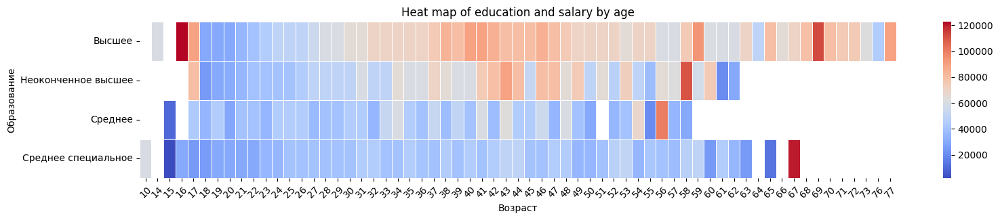

In [46]:
data['ЗП(руб)'] = data['ЗП(руб)'].astype(float)

grouped = data.pivot_table(columns='Возраст', index='Образование', values='ЗП(руб)', aggfunc='median')

fig, ax = plt.subplots(figsize=(18,3))

sns.heatmap(data=grouped, cmap='coolwarm', ax=ax, linewidths=0.7)
plt.xticks(rotation=45)
ax.set_title('Heat map of education and salary by age')
plt.show()


It can be seen that people with higher education and incomplete higher education expect to see the highest wages. Gradation is also visible - with age, salary requirements increase. There are some outliers (at 16 there is no higher education). But you can imagine an intelligent specialist with dozens of years of experience in work requiring secondary specialized education.

8. Let's build a **scatterplot** showing the dependence of work experience (**"Work experience (month)"**) on age (**"Age"**). We will translate the work experience from months to years so that the signs are on the same scale. Let's build an additional line on the chart passing through the points (0, 0) and (100, 100). This straight line corresponds to the values when work experience is equal to the person's age.

In [47]:
line_data = pd.DataFrame({'x':[0,100], 'y':[0,100]})
data1 = data.copy()
data1['Опыт работы (Год)'] = round(data1['Опыт работы (месяц)']/12)

fig = px.scatter(
    data_frame=data1,
    x = 'Возраст',
    y = 'Опыт работы (Год)',
    title='Dependence of work experience on the number of years'
)
fig.add_trace(px.line(
    data_frame=line_data,
    x = 'x',
    y = 'y'
    ).data[0])


Thanks to this graph, outliers of values are visible. You can also see a uniform distribution of age and experience.

In [48]:

data1['Опыт работы (Год)sort'] = data1[(data1['Опыт работы (Год)'] < (data1['Возраст'] - 9)) & (data1['Образование'] == 'Высшее') & (data1['ЗП(руб)'] > 9000)]['Опыт работы (Год)']

fig = px.scatter(
    data_frame=sigma_3(data1, 'ЗП(руб)'),
    x = 'Опыт работы (Год)sort',
    y = 'ЗП(руб)',
    color = 'Пол',
    color_discrete_map={"Ж":'pink', "М":'blue'},
    title='Salary based on work experience for men and women'
)
fig.show()

grouped = data.groupby(by=['полный день','Пол'], as_index=False)['ЗП(руб)'].median()

fig = px.bar(
    data_frame=grouped,
    x = "полный день",
    y = 'ЗП(руб)',
    color='Пол',
    color_discrete_map={"Ж":'pink', "М":'blue'},
    title='Salary by type of working day for men and women'
)
fig.show()



1. The first graph clearly shows the increase in salary with up to 10 years of experience, after which the values go down. I dare to suggest that this is due to the high wages of IT specialists, among whom there are very few people with more than 20 years of experience, and therefore after this number of years the values will decline.

There is also an interesting relationship with the expected salary and gender of the applicant - men have the most experience and the desired salary, which is reasonable in Russia.

2. The second graph also shows the relationship with gender and salary, and as one would expect, full-time job seekers have a higher salary.

# Data cleaning

1. Let's start with duplicates in our data. Find **full duplicates** in the resume table and delete them.

In [49]:
data1 = data.copy()
display(data1.duplicated().value_counts())
data1 = data1.drop_duplicates()
data = data1.copy()

False    44583
True       161
Name: count, dtype: int64

2. Let's deal with passes. Display information **about the number of gaps** in columns.

In [50]:
data1 = data.copy()
data1.info()


data1.shape
data = data1.copy()


<class 'pandas.core.frame.DataFrame'>
Index: 44583 entries, 0 to 44743
Data columns (total 23 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Ищет работу на должность:        44583 non-null  object 
 1   Последнее/нынешнее место работы  44582 non-null  object 
 2   Последняя/нынешняя должность     44581 non-null  object 
 3   Обновление резюме                44583 non-null  object 
 4   Авто                             44583 non-null  object 
 5   Образование                      44583 non-null  object 
 6   Пол                              44583 non-null  object 
 7   Возраст                          44583 non-null  int64  
 8   Опыт работы (месяц)              44415 non-null  float64
 9   Город                            44583 non-null  object 
 10  переезд                          44583 non-null  bool   
 11  командировки                     44583 non-null  bool   
 12  полная занятость       

3. So, we have gaps in 3 columns: **"Work experience (month)"**, **"Last/current place of work"**, **"Last/current position"**. Let's do the following: delete the rows where there is a gap in the columns with the place of work and position. Fill in the gaps in the work experience column with the **median** value.

In [51]:
data1 = data.copy()

data1['Опыт работы (месяц)'] = data1['Опыт работы (месяц)'].fillna(value=100)
data1 = data1.dropna(thresh=23)
data1.info()
data = data1.copy()
data1['Опыт работы (месяц)'].mean()

<class 'pandas.core.frame.DataFrame'>
Index: 44581 entries, 0 to 44743
Data columns (total 23 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Ищет работу на должность:        44581 non-null  object 
 1   Последнее/нынешнее место работы  44581 non-null  object 
 2   Последняя/нынешняя должность     44581 non-null  object 
 3   Обновление резюме                44581 non-null  object 
 4   Авто                             44581 non-null  object 
 5   Образование                      44581 non-null  object 
 6   Пол                              44581 non-null  object 
 7   Возраст                          44581 non-null  int64  
 8   Опыт работы (месяц)              44581 non-null  float64
 9   Город                            44581 non-null  object 
 10  переезд                          44581 non-null  bool   
 11  командировки                     44581 non-null  bool   
 12  полная занятость       

114.35777573405711

4. We got to the elimination of emissions. Let's clear the data manually first. We will delete resumes that indicate wages either above 1 million rubles or below 1 thousand rubles.

In [52]:

outliers = data[(data['ЗП(руб)'] > 1e6) | (data['ЗП(руб)'] < 1e3)]
data = data.drop(outliers.index)
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 44492 entries, 0 to 44743
Data columns (total 23 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Ищет работу на должность:        44492 non-null  object 
 1   Последнее/нынешнее место работы  44492 non-null  object 
 2   Последняя/нынешняя должность     44492 non-null  object 
 3   Обновление резюме                44492 non-null  object 
 4   Авто                             44492 non-null  object 
 5   Образование                      44492 non-null  object 
 6   Пол                              44492 non-null  object 
 7   Возраст                          44492 non-null  int64  
 8   Опыт работы (месяц)              44492 non-null  float64
 9   Город                            44492 non-null  object 
 10  переезд                          44492 non-null  bool   
 11  командировки                     44492 non-null  bool   
 12  полная занятость       

5. During our exploratory analysis, we found resumes with **work experience in years greater than the applicant's age**. Let's find such summaries and remove them from the data

In [53]:
data1 = data.copy()

data1 = data1[(data1['Опыт работы (месяц)']/12) < data1['Возраст']]
data1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 44485 entries, 0 to 44743
Data columns (total 23 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Ищет работу на должность:        44485 non-null  object 
 1   Последнее/нынешнее место работы  44485 non-null  object 
 2   Последняя/нынешняя должность     44485 non-null  object 
 3   Обновление резюме                44485 non-null  object 
 4   Авто                             44485 non-null  object 
 5   Образование                      44485 non-null  object 
 6   Пол                              44485 non-null  object 
 7   Возраст                          44485 non-null  int64  
 8   Опыт работы (месяц)              44485 non-null  float64
 9   Город                            44485 non-null  object 
 10  переезд                          44485 non-null  bool   
 11  командировки                     44485 non-null  bool   
 12  полная занятость       

6. As a result of the analysis, we found potential outliers in the feature **"Age"**. These turned out to be resumes of people too old to look for work. Let's try to build the distribution of the feature on a **logarithmic scale**.

Let's display a table with the resulting emissions.

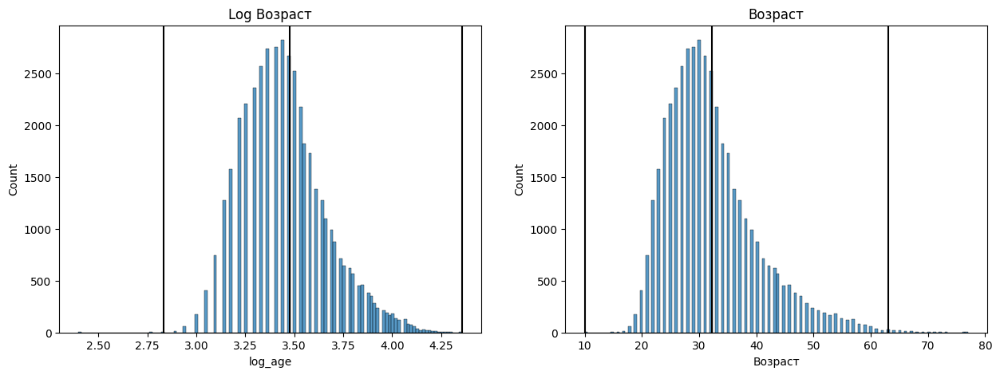

In [54]:
data = data1.copy()
data['log_age'] = np.log(data['Возраст'].astype(float)+1)

data['age_sigma_log'] = sigma_3(data,'log_age', right_s=4)['log_age']
data['age_sigma'] = sigma_3(data, 'Возраст', right_s=4)['Возраст']


fig, ax = plt.subplots(figsize=(15,5), nrows=1, ncols=2)

sns.histplot(
    data=data,
    x = 'Возраст',
    #bins=70,
    ax = ax[1]
)


sns.histplot(
    data=data,
    x='log_age',
    #bins = 70,
    ax=ax[0],
    

)

ax[0].axvline(data['log_age'].mean(), color ='k')
ax[0].axvline(data['age_sigma_log'].min(), color = 'k')
ax[0].axvline(data['age_sigma_log'].max(), color = 'k')
ax[0].set_title('Log Возраст')

ax[1].axvline(data['Возраст'].mean(), color ='k')
ax[1].axvline(data['age_sigma'].min(), color = 'k')
ax[1].axvline(data['age_sigma'].max(), color = 'k')
ax[1].set_title('Возраст')


plt.show()


data.drop(columns=['age_sigma_log', 'log_age', 'Возраст'], inplace=True)






As you can see in the above graphs, the histogram has a right-sided asymmetry, and the age after which the outliers follow according to the three-sigma rule is 63. Interestingly, the number of values in the column for applying sigma for age and applying sigma for the logarithm of age is different. However, in general, the graph looks normal, with pronounced asymmetry.